# DS Partial Plots
- The following plots were discussed with Michael on Wednesday 07-03-19.
- The first set is gradient plots vs. z for x = 0, 0.3, 0.7 m and y = 0 m. This will help us see a baseline check of satisfying one requirement of the DS field.
    - Should look into the rest of the requirements and develop tests of this as well.
    - In the long run it makes sense to develop 2 sets of tests: ones which can use certain sparse sets of data, and ones which test the full dataset.
- The second set investigates using the distinct feature (hump) between z = 7.071 m and z = 7.836
    - This is a good place to verify (or refute) our coordinate system.
    - Do we need to do this somewhere else (downstream DS) to give further verification?
    - Find a way to quantify the degree of confidence in the coordinate system given a certain number of steps in z.

## Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [3]:
import numpy as np
import pandas as pd
import pickle as pkl
from datetime import datetime
from dateutil import parser

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
plt.rcParams['figure.figsize'] = (12.0, 8.0)
plt.rcParams['axes.axisbelow'] = True

from plotly.offline import init_notebook_mode, plot, iplot
import plotly.graph_objs as go
import plotly.io as pio
from plotly import tools
init_notebook_mode(True)

from hallprobecalib import hpc_ext_path
from hallprobecalib.hpcplots import scatter2d,scatter3d,histo

from mu2e import mu2e_ext_path
from mu2e.dataframeprod import DataFrameMaker
from mu2e.mu2eplots import mu2e_plot, mu2e_plot3d

In [4]:
from hallprobecalib.hallrawdataframe import gradient_calc

In [5]:
plotdir = mu2e_ext_path + 'plots/partial_plots/'

In [95]:
df = DataFrameMaker(mu2e_ext_path+"datafiles/Mau13/Mu2e_DSMap_V13",input_type='pkl').data_frame

## Gradient Plots

In [7]:
df.eval("B = (Bx**2 + By**2 + Bz**2)**(1/2)", inplace=True)

In [9]:
df['Gx_Bx'],df['Gy_Bx'],df['Gz_Bx'],df['G_Bx'] = gradient_calc(df, f="Bx", ds=True)

In [10]:
df['Gx_By'],df['Gy_By'],df['Gz_By'],df['G_By'] = gradient_calc(df, f="By", ds=True)

In [11]:
df['Gx_Bz'],df['Gy_Bz'],df['Gz_Bz'],df['G_Bz'] = gradient_calc(df, f="Bz", ds=True)

In [12]:
df['Gx_B'],df['Gy_B'],df['Gz_B'],df['G_B'] = gradient_calc(df, f="B", ds=True)

In [24]:
df.describe()

,X,Y,Z,Bx,By,Bz,R,Phi,Bphi,Br,...,Gz_By,G_By,Gx_Bz,Gy_Bz,Gz_Bz,G_Bz,Gx_B,Gy_B,Gz_B,G_B
count,4.902089e+06,4.902089e+06,4.902089e+06,4.902089e+06,4.902089e+06,4.902089e+06,4.902089e+06,4.902089e+06,4.902089e+06,4.902089e+06,...,4.902089e+06,4.902089e+06,4.902089e+06,4.902089e+06,4.902089e+06,4.902089e+06,4.902089e+06,4.902089e+06,4.902089e+06,4.902089e+06
mean,2.764428e-17,-9.276603e-19,9.571000e+00,-8.827929e+00,-2.244599e+00,6.198597e+03,9.277613e-01,1.602683e-02,3.935920e-01,2.702372e+02,...,-5.504516e-02,5.596148e+03,-1.638185e-01,-3.621346e-02,-3.570224e+02,1.883337e+04,-2.288112e+01,4.074386e-01,-4.217702e+02,1.614164e+04
std,7.000001e-01,7.000001e-01,3.759987e+00,1.394832e+03,1.393910e+03,6.534709e+03,3.453389e-01,1.804710e+00,2.826868e+01,1.953151e+03,...,1.012623e+04,1.244230e+04,4.524811e+04,4.524203e+04,1.202437e+04,6.232376e+04,3.417287e+04,3.425656e+04,1.156194e+04,4.705955e+04
min,-1.200000e+00,-1.200000e+00,3.071000e+00,-2.138794e+04,-1.970281e+04,-9.431958e+03,0.000000e+00,-3.120762e+00,-2.061862e+03,-2.181346e+04,...,-2.346686e+05,2.034359e-01,-5.526017e+05,-5.613088e+05,-2.471538e+05,9.927634e-01,-4.246040e+05,-4.274296e+05,-2.601942e+05,1.006440e+00
25%,-6.000000e-01,-6.000000e-01,6.321000e+00,-1.806879e+02,-1.717066e+02,9.207227e+01,6.823672e-01,-1.549966e+00,-8.034235e+00,1.984985e+01,...,-3.671689e+02,1.602264e+02,-4.107912e+02,-4.201937e+02,-1.677361e+03,2.798548e+02,-3.867219e+02,-3.737215e+02,-2.066094e+03,2.828900e+02
50%,0.000000e+00,0.000000e+00,9.571000e+00,-1.027289e+01,-4.135822e+00,6.234710e+03,9.659840e-01,0.000000e+00,-6.187535e-01,1.124642e+02,...,1.320053e+00,1.166904e+03,-4.476340e-01,9.029080e-01,-2.059329e+02,2.086194e+03,-2.186225e+00,1.327793e+00,-1.770412e+02,2.204279e+03
75%,6.000000e-01,6.000000e-01,1.282100e+01,1.633486e+02,1.701872e+02,1.028116e+04,1.185327e+00,1.570796e+00,6.353547e+00,7.027772e+02,...,3.639580e+02,5.053351e+03,4.281613e+02,4.108132e+02,5.649140e+01,9.413064e+03,3.692526e+02,3.698125e+02,2.192786e+02,9.858663e+03
max,1.200000e+00,1.200000e+00,1.607100e+01,2.056366e+04,1.980982e+04,2.382539e+04,1.697056e+00,3.141593e+00,2.076274e+03,2.098097e+04,...,2.523750e+05,2.530366e+05,5.835767e+05,5.640530e+05,2.302593e+05,7.830423e+05,4.278629e+05,4.277317e+05,2.575331e+05,5.476614e+05


### any phi

In [73]:
# any phi
c0 = (df.R < 0.0+0.001) & (df.R > 0.0-0.001) & (df.Z > 8.13) & (df.Z < 13.23)
c4 = (df.R < 0.4+0.001) & (df.R > 0.4-0.001) & (df.Z > 8.13) & (df.Z < 13.23)
c7 = (df.R < 0.7+0.001) & (df.R > 0.7-0.001) & (df.Z > 8.13) & (df.Z < 13.23)

In [79]:
fig = scatter2d([df[c0].Z],[df[c7].Gz_Bz], lines=False,markers=True,size_list=2, inline = True)

In [82]:
fig = scatter2d([df[c0].Z,df[c4].Z,df[c7].Z],[df[c0].Bz,df[c4].Bz,df[c7].Bz,],lines=False,markers=True,size_list=3*[4], inline = True)
fig = scatter2d([df[c0].Z,df[c4].Z,df[c7].Z],[df[c0].Gz_Bz,df[c4].Gz_Bz,df[c7].Gz_Bz], lines=False,markers=True,size_list=3*[4], inline = True)
fig = scatter2d([df[c0].Z,df[c4].Z],[df[c0].Gz_Bz,df[c4].Gz_Bz], lines=False,markers=True,size_list=2*[4], inline = True)

In [75]:
df[c0].Gz_Bz.describe()

count     204.000000
mean     -199.447202
std       201.263294
min     -1328.372281
25%      -186.832093
50%      -139.976482
75%       -90.653606
max       -69.214780
Name: Gz_Bz, dtype: float64

In [76]:
df[c4].Gz_Bz.describe()

count    2448.000000
mean     -141.466737
std        91.329237
min      -695.944004
25%      -174.859436
50%      -130.909166
75%       -77.756670
max       -32.043757
Name: Gz_Bz, dtype: float64

In [77]:
df[c7].Gz_Bz.describe()

count    4080.000000
mean      -44.078063
std       217.144858
min      -374.307130
25%      -169.478481
50%       -85.840267
75%        15.518261
max      1180.049230
Name: Gz_Bz, dtype: float64

### y axis

In [ ]:
# y axis
c0 = (df.Y == 0.0) & (df.X == 0.0) & (df.Z > 8.13) & (df.Z < 13.23)
c4 = (df.Y == 0.4) & (df.X == 0.0) & (df.Z > 8.13) & (df.Z < 13.23)
c7 = (df.Y == 0.7) & (df.X == 0.0) & (df.Z > 8.13) & (df.Z < 13.23)

In [52]:
fig = scatter2d(3*[df[c0].Z],[df[c0].Bz,df[c4].Bz,df[c7].Bz,], inline = True)
fig = scatter2d(3*[df[c0].Z],[df[c0].Gz_Bz,df[c4].Gz_Bz,df[c7].Gz_Bz], inline = True)

In [53]:
df[c0].Gz_Bz.describe()

count     204.000000
mean     -199.447202
std       201.263294
min     -1328.372281
25%      -186.832093
50%      -139.976482
75%       -90.653606
max       -69.214780
Name: Gz_Bz, dtype: float64

In [54]:
df[c4].Gz_Bz.describe()

count    204.000000
mean    -140.981403
std       91.264383
min     -651.748587
25%     -175.312320
50%     -130.321603
75%      -78.787077
max      -45.125719
Name: Gz_Bz, dtype: float64

In [55]:
df[c7].Gz_Bz.describe()

count     204.000000
mean      -41.807152
std       220.418798
min      -300.834556
25%      -170.563648
50%       -82.974619
75%        17.036306
max      1114.133584
Name: Gz_Bz, dtype: float64

## x axis

In [111]:
# x axis
c0 = (df.X == 0.0) & (df.Y == 0.0) & (df.Z > 8.13) & (df.Z < 13.23)
c4 = (df.X == 0.4) & (df.Y == 0.0) & (df.Z > 8.13) & (df.Z < 13.23)
c7 = (df.X == 0.7) & (df.Y == 0.0) & (df.Z > 8.13) & (df.Z < 13.23)
c0f = (df.X == 0.0) & (df.Y == 0.0) #& (df.Z > 8.13) & (df.Z < 13.23)
c4f = (df.X == 0.4) & (df.Y == 0.0) #& (df.Z > 8.13) & (df.Z < 13.23)
c7f = (df.X == 0.7) & (df.Y == 0.0) #& (df.Z > 8.13) & (df.Z < 13.23)

In [112]:
fig = scatter2d(3*[df[c0f].Z],[df[c0f].Bz,df[c4f].Bz,df[c7f].Bz,], inline = True)
fig = scatter2d(3*[df[c0f].Z],[df[c0f].Gz_Bz,df[c4f].Gz_Bz,df[c7f].Gz_Bz], inline = True)

In [114]:
fig = scatter2d(3*[df[c0f].Z],[0.01*df[c0f].Gx_Bz,0.01*df[c4f].Gx_Bz,0.01*df[c7f].Gx_Bz], inline = True)
fig = scatter2d(3*[df[c0f].Z],[0.01*df[c0f].Gy_Bz,0.01*df[c4f].Gy_Bz,0.01*df[c7f].Gy_Bz], inline = True)
fig = scatter2d(3*[df[c0f].Z],[0.01*df[c0f].Gz_Bz,0.01*df[c4f].Gz_Bz,0.01*df[c7f].Gz_Bz], inline = True)

#### Automate!

In [13]:
c0 = (df.X == 0.0) & (df.Y == 0.0) #& (df.Z > 8.13) & (df.Z < 13.23)
c4 = (df.X == 0.4) & (df.Y == 0.0) #& (df.Z > 8.13) & (df.Z < 13.23)
c7 = (df.X == 0.7) & (df.Y == 0.0) #& (df.Z > 8.13) & (df.Z < 13.23)

df_0 = df[c0]
df_4 = df[c4]
df_7 = df[c7]

In [42]:
rs = [0., 0.4, 0.7]
ax = "X"
if ax == "X":
    zer = "Y"
    nz = "X"
elif ax == "Y":
    zer = "X"
    nz = "Y"
c0 = (df[nz] == rs[0]) & (df[zer] == 0.0) & (df.Z > 8.13) & (df.Z < 13.23)
c4 = (df[nz] == rs[1]) & (df[zer] == 0.0) & (df.Z > 8.13) & (df.Z < 13.23)
c7 = (df[nz] == rs[2]) & (df[zer] == 0.0) & (df.Z > 8.13) & (df.Z < 13.23)
df_0 = df[c0]
df_4 = df[c4]
df_7 = df[c7]
gcors = ['x','y','z']
bcors = ['x','y','z']
#vss = ["X","Y","Z"]
vs = "Z"

In [43]:
for gcor in gcors:
    for bcor in bcors: 
        x = df_0[vs]
        y = f"G{gcor}_B{bcor}"
        fig = scatter2d(3*[x],[0.01*df_0[y],0.01*df_4[y],0.01*df_7[y]],legend_list=[f"{nz} = {rs[0]} m, {zer} = 0 m",f"{nz} = {rs[1]} m, {zer} = 0 m",f"{nz} = {rs[2]} m, {zer} = 0 m"],show_plot=False, inline = True)
        fig.layout.xaxis.title = f"{vs} (m)"
        fig.layout.yaxis.title = f"dB{bcor}/d{gcor} (G / m)"
        fig.layout.title = f"dB{bcor}/d{gcor} vs. {vs}, along {ax} axis"
        #iplot(fig)
        filename = f"flat/{ax}axis_dB{bcor}_d{gcor}_vs_{vs}_flat"
        plot(fig,filename=plotdir+f"gradient/{filename}.html", auto_open=False)
        pio.write_image(fig,plotdir+f"gradient/{filename}.png")
        pio.write_image(fig,plotdir+f"gradient/{filename}.pdf")

#### Tracker region

In [46]:
fig = scatter2d(3*[df[c0].Z],[df[c0].Bz,df[c4].Bz,df[c7].Bz,], inline = True)
fig = scatter2d(3*[df[c0].Z],[df[c0].Gz_Bz,df[c4].Gz_Bz,df[c7].Gz_Bz], inline = True)

We can now get an estimate on the error in field value by shifting coordinate system by 1cm in z by multiplying dBz/dz * error_z = error_Bz.

In [88]:
fig = scatter2d(3*[df[c0].Z],[.01*df[c0].Gz_Bz,.01*df[c4].Gz_Bz,.01*df[c7].Gz_Bz], inline = True)

For a 1cm shift we get an error of -1 to -2 Gauss in spectrometer region, which is probably not acceptable. For a 1mm (divide error by 10) it's O(10^-5) and likely negligible to physics results. We anticipate survey techniques to be better than 1cm or even 1mm.

In [47]:
df[c0].Gz_Bz.describe()

count     204.000000
mean     -199.447202
std       201.263294
min     -1328.372281
25%      -186.832093
50%      -139.976482
75%       -90.653606
max       -69.214780
Name: Gz_Bz, dtype: float64

In [48]:
df[c4].Gz_Bz.describe()

count    204.000000
mean    -137.893176
std       85.495863
min     -609.604617
25%     -170.891470
50%     -126.899662
75%      -76.549478
max      -48.533536
Name: Gz_Bz, dtype: float64

In [49]:
df[c7].Gz_Bz.describe()

count     204.000000
mean      -39.419892
std       224.076050
min      -282.087992
25%      -165.298436
50%       -84.241973
75%         6.910229
max      1176.572944
Name: Gz_Bz, dtype: float64

In [50]:
fig = scatter2d(3*[df[c0].Z],[df[c0].Gz_B,df[c4].Gz_B,df[c7].Gz_B], inline = True)
fig = scatter2d(3*[df[c0].Z],[df[c0].Br,df[c4].Br,df[c7].Br,], inline = True)

In [81]:
sorted(df.R.unique())

[0.0,
 0.025,
 0.035355339,
 0.05,
 0.055901699,
 0.070710678,
 0.075,
 0.079056942,
 0.090138782,
 0.1,
 0.103077641,
 0.106066017,
 0.111803399,
 0.125,
 0.127475488,
 0.13462912,
 0.141421356,
 0.145773797,
 0.15,
 0.152069063,
 0.158113883,
 0.160078106,
 0.167705098,
 0.175,
 0.176776695,
 0.180277564,
 0.182002747,
 0.190394328,
 0.195256242,
 0.2,
 0.201556444,
 0.206155281,
 0.212132034,
 0.213600094,
 0.215058132,
 0.223606798,
 0.225,
 0.226384628,
 0.230488611,
 0.235849528,
 0.237170825,
 0.246221445,
 0.247487373,
 0.25,
 0.251246891,
 0.254950976,
 0.257390754,
 0.261007663,
 0.265753645,
 0.26925824,
 0.270416346,
 0.275,
 0.276134025,
 0.279508497,
 0.282842712,
 0.285043856,
 0.291547595,
 0.292617498,
 0.3,
 0.301039864,
 0.302076149,
 0.304138127,
 0.30516389,
 0.309232922,
 0.313249102,
 0.316227766,
 0.318198052,
 0.320156212,
 0.325,
 0.32596012,
 0.328823661,
 0.333541602,
 0.335410197,
 0.336340601,
 0.340036763,
 0.3473111,
 0.348209707,
 0.35,
 0.350891721,
 0

### Comparing Results
- All results seem consistent with results from Hank Glass in docdb-#26673 (note there units are in T, not G).

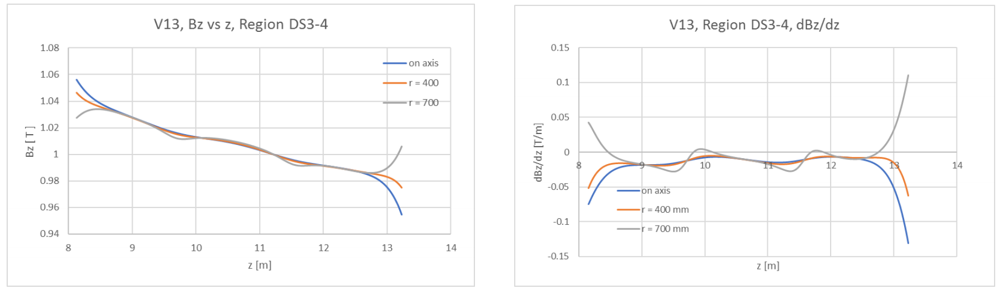

## dBz/dx
- Let's try the same thing for a shift in x coordinate.

## x axis

In [91]:
# x axis
c0 = (df.X == 0.0) & (df.Y == 0.0) & (df.Z > 8.13) & (df.Z < 13.23)
c4 = (df.X == 0.4) & (df.Y == 0.0) & (df.Z > 8.13) & (df.Z < 13.23)
c7 = (df.X == 0.7) & (df.Y == 0.0) & (df.Z > 8.13) & (df.Z < 13.23)

In [92]:
fig = scatter2d(3*[df[c0].Z],[df[c0].Bz,df[c4].Bz,df[c7].Bz,], inline = True)
fig = scatter2d(3*[df[c0].Z],[df[c0].Gx_Bz,df[c4].Gx_Bz,df[c7].Gx_Bz], inline = True)

We can now get an estimate on the error in field value by shifting coordinate system by 1cm in z by multiplying dBz/dz * error_z = error_Bz.

In [93]:
fig = scatter2d(3*[df[c0].Z],[.01*df[c0].Gx_Bz,.01*df[c4].Gx_Bz,.01*df[c7].Gx_Bz], inline = True)

## Coordinate System Feature

- DSFM Hall probe R (mm): 47, 319, 487, 655, 798
- Closes matches in Mau13 (m): 0.05, 0.325, 0.475, 0.65, 0.8

In [97]:
df.eval("B = (Bx**2 + By**2 + Bz**2)**(1/2)", inplace=True)

In [10]:
df.X.unique()

array([-1.2  , -1.175, -1.15 , -1.125, -1.1  , -1.075, -1.05 , -1.025,
       -1.   , -0.975, -0.95 , -0.925, -0.9  , -0.875, -0.85 , -0.825,
       -0.8  , -0.775, -0.75 , -0.725, -0.7  , -0.675, -0.65 , -0.625,
       -0.6  , -0.575, -0.55 , -0.525, -0.5  , -0.475, -0.45 , -0.425,
       -0.4  , -0.375, -0.35 , -0.325, -0.3  , -0.275, -0.25 , -0.225,
       -0.2  , -0.175, -0.15 , -0.125, -0.1  , -0.075, -0.05 , -0.025,
        0.   ,  0.025,  0.05 ,  0.075,  0.1  ,  0.125,  0.15 ,  0.175,
        0.2  ,  0.225,  0.25 ,  0.275,  0.3  ,  0.325,  0.35 ,  0.375,
        0.4  ,  0.425,  0.45 ,  0.475,  0.5  ,  0.525,  0.55 ,  0.575,
        0.6  ,  0.625,  0.65 ,  0.675,  0.7  ,  0.725,  0.75 ,  0.775,
        0.8  ,  0.825,  0.85 ,  0.875,  0.9  ,  0.925,  0.95 ,  0.975,
        1.   ,  1.025,  1.05 ,  1.075,  1.1  ,  1.125,  1.15 ,  1.175,
        1.2  ])

In [20]:
plotdir = mu2e_ext_path+'plots/graded_feature_7m/'

In [29]:
#xs = [0.,.5,.6,.8,.9]
xs = [0.05,0.325,0.475,0.65,0.8]
nxs = [-0.05,-0.325,-0.475,-0.65,-0.8]
ax = 'y'
sign = 'pos'
for x in xs:
    c = (df.X == 0.0) & (df.Y == x) & (df.Z > 7.07) & (df.Z < 7.84)
    for b in ['Br','Bphi','Bz','B']:
        fig = scatter2d(df[c].Z,df[c][b],legend_list=[f"x = 0, y = {x}"],show_plot=False,inline=True)#,markers=True,lines=False,size_list=[4])
        fig.layout.xaxis.title = f"Z (m)"
        fig.layout.yaxis.title = f"{b} (G)"
        fig.layout.title = f"{b} vs. Z, along +y axis"
        filename = f"{ax}_{sign}/{ax}_{sign}_{b}_vs_Z_feature_7m_{x}"
        plot(fig,filename=plotdir+f"{filename}.html", auto_open=False)
        pio.write_image(fig,plotdir+f"{filename}.png")
        pio.write_image(fig,plotdir+f"{filename}.pdf")

In [55]:
df_shift = DataFrameMaker(mu2e_ext_path+"datafiles/Mau13/Mu2e_DSMap_V13",input_type='pkl').data_frame
df_shift.eval("B = (Bx**2 + By**2 + Bz**2)**(1/2)", inplace=True)

In [30]:
#df_shift.eval("X = X + 0.025",inplace=True)
#df_shift.eval("Y = Y + 0.025",inplace=True)
#df_shift.eval("Z = Z + 0.025",inplace=True)

In [31]:
#df_shift.eval("B = (Bx**2 + By**2 + Bz**2)**(1/2)", inplace=True)

## Big Plotting Work
- Plots all errors in feature region for shifts of 25mm in x,y,z

In [98]:
df_shift = DataFrameMaker(mu2e_ext_path+"datafiles/Mau13/Mu2e_DSMap_V13",input_type='pkl').data_frame
df_shift.eval("B = (Bx**2 + By**2 + Bz**2)**(1/2)", inplace=True)

ys = [0.05,0.325,0.5,0.65,0.8]#0.475,0.65,0.8]
nys = [-y for y in ys]#[-0.05,-0.325,-0.5,-0.65,-0.8]
#nys = [-0.05,-0.325,-0.5,-0.65,-0.8]
bs = ['Br','Bphi','Bz','B']
axs = ["x", "y"]
signs = ["pos","neg"]
shifts = ["X","Y","Z"]

for shifted in shifts:
    #df_shift = DataFrameMaker(mu2e_ext_path+"datafiles/Mau13/Mu2e_DSMap_V13",input_type='pkl').data_frame
    #df_shift.eval("B = (Bx**2 + By**2 + Bz**2)**(1/2)", inplace=True)
    df_shift.eval(f"{shifted} = {shifted} + 0.025",inplace=True)
    
    for ax in axs:
        for sign in signs:
            for b in bs:
                if sign == "pos":
                    iterator = ys
                else:
                    iterator = nys
                if ax == "x":
                    titles = tuple([[f"{b} vs. Z, x = {y}, y = 0",f"{b} Residual vs. Z, x = {y}, y = 0"]
                                            for y in ys])
                else:
                    titles = tuple([[f"{b} vs. Z, x = 0, y = {y}",f"{b} Residual vs. Z, x = 0, y = {y}"]
                                            for y in ys])
                titles = tuple(titles[0]+titles[1]+titles[2]+titles[3]+titles[4])
                fig_sub = tools.make_subplots(rows=len(ys), cols=2, subplot_titles=titles);
                
                    
                for i,y in enumerate(iterator):
                    if ax == "y":
                        #c = (df.X == 0.) & (df.Y == y) & (df.Z > 7.07) & (df.Z < 7.84)
                        #c2 = (df_shift.X == 0.) & (df_shift.Y == y) & (df_shift.Z > 7.07) & (df_shift.Z < 7.84)
                        c = np.isclose(df.X,0.) & np.isclose(df.Y,y) & (df.Z > 7.07) & (df.Z < 7.84)
                        c2 = np.isclose(df_shift.X,0.) & np.isclose(df_shift.Y,y) & (df_shift.Z > 7.07) & (df_shift.Z < 7.84)
                    else:
                        c = np.isclose(df.X,0.) & np.isclose(df.Y,y) & (df.Z > 7.07) & (df.Z < 7.84)
                        c2 = np.isclose(df_shift.X,0.) & np.isclose(df_shift.Y,y) & (df_shift.Z > 7.07) & (df_shift.Z < 7.84)
                        #c = (df.X == y) & (df.Y == 0.) & (df.Z > 7.07) & (df.Z < 7.84)
                        #c2 = (df_shift.X == y) & (df_shift.Y == 0.) & (df_shift.Z > 7.07) & (df_shift.Z < 7.84)

                    #print(len(df[c]),len(df_shift[c2]))
                    fig = scatter2d([df[c].Z,df_shift[c2].Z],[df[c][b],df_shift[c2][b]],
                                    show_plot=False,inline=True,legend_list=[f"Mau13",f"Shifted {shifted}"])
                    #fig.layout.title = f"{b} vs. Z, x = 0, y = {y}"
                    #print(df_shift[c2][b].values - df[c][b].values)
                    err = pd.Series(df_shift[c2][b].values-df[c][b].values,name=f"err_{b}")
                    #print(err)
                    fig_err = scatter2d(df[c].Z,err,legend_list=[f"error {shifted} +25 mm shift"],inline=True,show_plot=False)
                    #fig_err.layout.title = f"{b} Residual vs. Z, x = 0, y = {y}"

                    #fig_sub = tools.make_subplots(rows=1, cols=2)

                    #fig_sub.append_trace(fig.data[0], 1, 1)
                    #fig_sub.append_trace(fig.data[1], 1, 1)
                    #fig_sub.append_trace(fig_err.data[0], 1, 2)

                    fig_sub.append_trace(fig.data[0], i+1, 1)
                    fig_sub.append_trace(fig.data[1], i+1, 1)
                    fig_sub.append_trace(fig_err.data[0], i+1, 2)

                    #fig_sub['layout'].update(height=5*600, width=1200, title='i <3 annotations and subplots')
                    #iplot(fig_sub, filename='simple-subplot-with-annotations')
                    #scatter2d([df_shift[c].Z],[df_shift[c].Bz],legend_list=[f"Shift z +1cm"],inline=True)
                    #scatter2d(df[c].Z,df[c].Bz,legend_list=[f"Shift z +1cm"],inline=True)

                xl = "Z (m)"
                yl = f"{b} (G)"
                
                nsubs = len(ys)*2
                for i in range(nsubs):
                    #fig['layout'][f'xaxis{i+1}'].update(title=xl)
                    #fig['layout'][f'yaxis{i+1}'].update(title=yl)
                    fig_sub['layout'][f'xaxis{i+1}'].title = xl
                    fig_sub['layout'][f'yaxis{i+1}'].title = yl
                
                #fig['layout']['xaxis1'].update(title=xl)
                #fig['layout']['xaxis2'].update(title=xl)
                #fig['layout']['xaxis3'].update(title=xl)
                #fig['layout']['xaxis4'].update(title=xl)

                #fig['layout']['yaxis1'].update(title='yaxis 1 title')
                #fig['layout']['yaxis2'].update(title='yaxis 2 title', range=[40, 80])
                #fig['layout']['yaxis3'].update(title='yaxis 3 title', showgrid=False)
                #fig['layout']['yaxis4'].update(title='yaxis 4 title')
                
                if sign == "pos":
                    title = f"{b} vs. Z, DSFM along +{ax} axis, Shift in {shifted}"
                else:
                    title = f"{b} vs. Z, DSFM along -{ax} axis, Shift in {shifted}"
                fig_sub['layout'].update(height=len(ys)*400, width=1200, title=title);
                #fig_sub.layout.showlegend = False
                #iplot(fig_sub, filename='simple-subplot-with-annotations')
                filename = f'errors_25mm_shift/{shifted}_shift/{b}_errors_{shifted}_shift_{ax}_{sign}'
                pio.write_image(fig_sub,plotdir+f"{filename}.pdf");
    df_shift.eval(f"{shifted} = {shifted} - 0.025",inplace=True)

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]  
[ (2,1) x3,y3 ]    [ (2,2) x4,y4 ]  
[ (3,1) x5,y5 ]    [ (3,2) x6,y6 ]  
[ (4,1) x7,y7 ]    [ (4,2) x8,y8 ]  
[ (5,1) x9,y9 ]    [ (5,2) x10,y10 ]

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]  
[ (2,1) x3,y3 ]    [ (2,2) x4,y4 ]  
[ (3,1) x5,y5 ]    [ (3,2) x6,y6 ]  
[ (4,1) x7,y7 ]    [ (4,2) x8,y8 ]  
[ (5,1) x9,y9 ]    [ (5,2) x10,y10 ]

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]  
[ (2,1) x3,y3 ]    [ (2,2) x4,y4 ]  
[ (3,1) x5,y5 ]    [ (3,2) x6,y6 ]  
[ (4,1) x7,y7 ]    [ (4,2) x8,y8 ]  
[ (5,1) x9,y9 ]    [ (5,2) x10,y10 ]

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]  
[ (2,1) x3,y3 ]    [ (2,2) x4,y4 ]  
[ (3,1) x5,y5 ]    [ (3,2) x6,y6 ]  
[ (4,1) x7,y7 ]    [ (4,2) x8,y8 ]  
[ (5,1) x9,y9 ]    [ (5,2) x10,y10 ]

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]  
[ (2,1) x3,y3 ]    [ (2,2) x4

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]  
[ (2,1) x3,y3 ]    [ (2,2) x4,y4 ]  
[ (3,1) x5,y5 ]    [ (3,2) x6,y6 ]  
[ (4,1) x7,y7 ]    [ (4,2) x8,y8 ]  
[ (5,1) x9,y9 ]    [ (5,2) x10,y10 ]

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]  
[ (2,1) x3,y3 ]    [ (2,2) x4,y4 ]  
[ (3,1) x5,y5 ]    [ (3,2) x6,y6 ]  
[ (4,1) x7,y7 ]    [ (4,2) x8,y8 ]  
[ (5,1) x9,y9 ]    [ (5,2) x10,y10 ]

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]  
[ (2,1) x3,y3 ]    [ (2,2) x4,y4 ]  
[ (3,1) x5,y5 ]    [ (3,2) x6,y6 ]  
[ (4,1) x7,y7 ]    [ (4,2) x8,y8 ]  
[ (5,1) x9,y9 ]    [ (5,2) x10,y10 ]

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]  
[ (2,1) x3,y3 ]    [ (2,2) x4,y4 ]  
[ (3,1) x5,y5 ]    [ (3,2) x6,y6 ]  
[ (4,1) x7,y7 ]    [ (4,2) x8,y8 ]  
[ (5,1) x9,y9 ]    [ (5,2) x10,y10 ]

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]  
[ (2,1) x3,y3 ]    [ (2,2) x4

In [28]:
pio.write_image(fig_sub,plotdir+f"Bz_errors.pdf")

In [116]:
fig.data

()

In [122]:
fig_sub = tools.make_subplots(rows=1, cols=2)

fig_sub.append_trace(fig.data[0], 1, 1)
fig_sub.append_trace(fig.data[1], 1, 1)
fig_sub.append_trace(fig.data[1], 1, 2)

fig_sub['layout'].update(height=600, width=800, title='i <3 annotations and subplots')
iplot(fig_sub, filename='simple-subplot-with-annotations')

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



In [113]:
fig.data[0]

Scatter({
    'marker': {'size': 2},
    'mode': 'lines',
    'name': 'x = 0, y = 0.8',
    'uid': 'dc3ac049-0b0e-4926-ac18-b06857ff032c',
    'x': array([7.071, 7.096, 7.121, 7.146, 7.171, 7.196, 7.221, 7.246, 7.271, 7.296,
                7.321, 7.346, 7.371, 7.396, 7.421, 7.446, 7.471, 7.496, 7.521, 7.546,
                7.571, 7.596, 7.621, 7.646, 7.671, 7.696, 7.721, 7.746, 7.771, 7.796,
                7.821]),
    'y': array([10933.4212247 , 11070.3757906 , 11241.301377  , 11440.689871  ,
                11661.2548058 , 11894.0217462 , 12128.7304591 , 12354.5193848 ,
                12560.7558288 , 12737.8174411 , 12877.6596485 , 12974.1014294 ,
                13022.8699819 , 13021.5115845 , 12969.2855963 , 12867.1238583 ,
                12717.6867745 , 12525.4668487 , 12296.8725435 , 12040.1494562 ,
                11765.049204  , 11482.2119837 , 11202.3438825 , 10935.3597408 ,
                10689.6782359 , 10471.7879653 , 10286.097528  , 10134.9905081 ,
                10

In [90]:
fig = mu2e_plot3d(df, "X", "Z", "Bz",
                 "R <= 1 and Phi == 0 and 7.07 <= Z <= 7.84",
                  mode='plotly_nb',ptype="3d",aspect='square',units='m'                 
                 )

In [105]:
fig = mu2e_plot3d(df, "X", "Z", "Bz",
                 f"R <= 1 and Y == 0.5 and 7.07 <= Z <= 7.84",
                  mode='plotly_nb',ptype="3d",aspect='square',units='m'                 
                 )

In [100]:
c = (df.R <= 1.) & (df.Y == 0) & (df.Z >= 7.07) & (df.Z <= 7.84)
#df_feat = df.query(f"R <= 1. and (Y == 0 or Phi == {np.pi})")

In [103]:
scatter3d(df[c].X,df[c].Z,df[c].Br,inline=True);
scatter3d(df[c].X,df[c].Z,df[c].Bphi,inline=True);
scatter3d(df[c].X,df[c].Z,df[c].Bz,inline=True);

In [107]:
z_steps = [i/1000 for i in range(4221,13921,100)]

In [108]:
z_steps

[4.221,
 4.321,
 4.421,
 4.521,
 4.621,
 4.721,
 4.821,
 4.921,
 5.021,
 5.121,
 5.221,
 5.321,
 5.421,
 5.521,
 5.621,
 5.721,
 5.821,
 5.921,
 6.021,
 6.121,
 6.221,
 6.321,
 6.421,
 6.521,
 6.621,
 6.721,
 6.821,
 6.921,
 7.021,
 7.121,
 7.221,
 7.321,
 7.421,
 7.521,
 7.621,
 7.721,
 7.821,
 7.921,
 8.021,
 8.121,
 8.221,
 8.321,
 8.421,
 8.521,
 8.621,
 8.721,
 8.821,
 8.921,
 9.021,
 9.121,
 9.221,
 9.321,
 9.421,
 9.521,
 9.621,
 9.721,
 9.821,
 9.921,
 10.021,
 10.121,
 10.221,
 10.321,
 10.421,
 10.521,
 10.621,
 10.721,
 10.821,
 10.921,
 11.021,
 11.121,
 11.221,
 11.321,
 11.421,
 11.521,
 11.621,
 11.721,
 11.821,
 11.921,
 12.021,
 12.121,
 12.221,
 12.321,
 12.421,
 12.521,
 12.621,
 12.721,
 12.821,
 12.921,
 13.021,
 13.121,
 13.221,
 13.321,
 13.421,
 13.521,
 13.621,
 13.721,
 13.821]

In [109]:
len(z_steps)

97